## `npri` v0.0.2 Tutorial

A Python package providing easy-to-use code that returns recently reported emissions from facilities, socio-economic information for places, emissions records for specific companies and industries, and emissions trends over time.

## Motivation
Dr. Ingrid Waldron [defines](https://en.ccunesco.ca/-/media/Files/Unesco/Resources/2020/07/EnvironmentalRacismCanada.pdf) environmental racism as "environmental policies, practices, or directives that disproportionately
disadvantage individuals, groups, or communities (intentionally or unintentionally) based on race or colour definition." The outcomes of environmental racism include inequitable access to environmental goods such as clean drinking water, unfair distribution of environmental harms such as air pollution, and uneven access to legal and other mechanisms that would address these. As Waldron notes, environmental racism "compounds other existing inequalities and challenges that Indigenous and other racialized groups face, such as low-income and poverty, underemployment and unemployment, food insecurity, poor access to healthcare, among others."

As of February 2024, Bill C-226 is under consideration in committee in Canada's Senate. Among other things, the Bill [proposes](https://www.parl.ca/DocumentViewer/en/44-1/bill/C-226/third-reading) addressing environmental racism through "a study that includes (i) an examination of the link between race, socio-economic status and environmental risk, and (ii) information and statistics relating to the location of environmental hazards."

npri-tools contributes to this work by prototyping what the data infrastructure for it might look like.

## Data Sources and Interpretation
We copy the National Pollutant Release Inventory (NPRI)'s Microsoft Access [database](https://open.canada.ca/data/en/dataset/06022cc0-a31e-4b4c-850d-d4dccda5f3ac) of emissions reports, company ownership, and more covering the years 1993-2022.

In the future, we hope to compile provincial-level enforcement and compliance records in order to understand the extent to which industry meets legal requirements and ministries implement rules. Claire Ewing, a graduate of UBC's Master in Environment, Resources and Sustainability, brought together that information for her [thesis](https://open.library.ubc.ca/soa/cIRcle/collections/ubctheses/24/items/1.0402474?o=16). Unfortunately, there doesn't seem to be any straightforward way to link provincial and federal-level records. For instance, Ontario's violations records do not link facilities with their NPRI identifiers. It may be possible to connect Ontario facility records with NPRI facility records based on contextual information, such as addresses, rather than IDs, but even basic information such as facility location is inconsistenly reported.

It's crucial to keep in mind that NPRI records are self-reported from industry. As in the United States, these reports are often based on [modeled estimates](https://propublica.org/article/whats-polluting-the-air-not-even-the-epa-can-say) rather than direct measurements and do not reflect pollutant concentrations in the air, water, or land. Recent research, for instance, has found [staggering discrepancies](https://www.cbc.ca/news/science/alberta-oilsands-research-emissions-1.7093626) between what some oil and gas operations report to NPRI and the actual concentration of pollutants in the air around these operations. NPRI itself has some useful [notes](https://www.canada.ca/en/environment-climate-change/services/national-pollutant-release-inventory/using-interpreting-data.html) on how to interpret its data.

One of the most glaring omissions from NPRI's records is any attempt to connect pollutants with health outcomes. Please visit the Indigenous-led Environmental Data Justice [lab](https://technoscienceunit.org/people/lab/) to learn about their work with communities in Ontario's Chemical Valley to "gather and translate diverse technical information into an accessible form so that people can more easily link health issues to facility activities."

We have also made a complete copy of Statistics Canada's 2021 Census though, at the moment, we only provide complete access to a handful of variables at the dissemination area scale. Although in many respects the Census is a robust snapshot of socio-economic patterns, it is well-recognized that measures such as "Aboriginal identity" are undercounted (i.e. in First Nation [reserves](https://www.cbc.ca/news/canada/north/indigenous-gaps-census-1.6419156) and [urban areas](https://www.cbc.ca/news/canada/toronto/toronto-urban-indigenous-census-1.6192449)).

## Installation and Basic Usage

In [ ]:
!pip install npri &>/dev/null;
from npri import npri

In [1]:
from npri import npri

/Users/enost/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## What NPRI-reporting facilities are near me?

We can look up information about NPRI-reporting facilities based on geography. We can find facilities within a Forward Sortation Area (FSA; the first three digits of a postal code), a province/territory, or those that are within 10km of a given point.

To find facilities in an FSA use the `place` argument (to search several FSAs, just add to the list). The object that is returned has a `data` property that lets us see the information as a dataframe:

In [2]:
fsas = npri.Facilities(place=["N1E"])
fsas.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/place=N1E report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/place=N1E


,ActiveYears,NumberOfActiveYears,ReportYear,NumberOfReports,NumberOfSubstances,NumberOfMedia,NumberOfMeasureMethods,NumberOfVOCs,NumberOfPAHs,Substances,...,DUNSNumber,MailingAddressID,Website,MostRecentYear,Owners,Addresses,NAICSPrimary,NAICSTitleEn,dauid,geometry
NpriID,,,,,,,,,,,,,,,,,,,,,
1436,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",27,2022,1,3,1,1,1,0,"Hydrochloric acid, Methylenebis(phenylisocyana...",...,,700754,,NaN,None,None,484221,"Bulk liquids trucking, local",35230378,POINT (7159022.725 904210.723)
3287,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,4,3,2,0,0,"Chromium (and its compounds), Nitrogen oxides ...",...,,692212,,NaN,"OC Canada Holdings Company, Owens Corning Comp...",,327214,Glass manufacturing,35230166,POINT (7158157.751 903332.766)
10418,"2002, 2004, 2005, 2006, 2007, 2008, 2009, 2014...",16,2022,1,4,3,1,0,0,"Aluminum (fume or dust only), Copper (and its ...",...,,686984,,NaN,None,None,331529,Non-ferrous metal foundries (except die-casting),35230378,POINT (7158785.563 904491.007)
10636,"2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010...",20,2022,1,2,1,1,0,0,"PM10 - Particulate Matter <= 10 Micrometers, P...",...,,667220,,NaN,Corporation of the City of Guelph,,562210,Waste treatment and disposal,35230227,POINT (7157555.014 906636.686)
11087,"2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013...",17,2022,1,1,2,1,0,0,Ammonia (total),...,207525098,675257,,NaN,Cargill Inc.,,311614,Rendering and meat processing from carcasses,35230380,POINT (7160415.563 905464.627)
11105,"2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011...",19,2022,1,4,1,1,1,0,"Ammonia (total), Peracetic acid (and its salts...",...,207525098,675257,,NaN,Cargill Inc.,,311616,Beef cattle slaughtering,35230378,POINT (7160463.046 904709.227)


To search facilities across a province or territory, use the `across` argument.

In [3]:
on = npri.Facilities(across=["ON"])
on.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/across=ON report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/across=ON


,ActiveYears,NumberOfActiveYears,ReportYear,NumberOfReports,NumberOfSubstances,NumberOfMedia,NumberOfMeasureMethods,NumberOfVOCs,NumberOfPAHs,Substances,...,DUNSNumber,MailingAddressID,Website,MostRecentYear,Owners,Addresses,NAICSPrimary,NAICSTitleEn,dauid,geometry
NpriID,,,,,,,,,,,,,,,,,,,,,
15,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,22,5,2,12,1,"1,2,4-Trimethylbenzene, 2-Butoxyethanol, Carbo...",...,,697656,,NaN,Stelco Incorporated,,332810,"Coating, engraving, cold and heat treating and...",35250318.0,POINT (7204007.428 876801.162)
21,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,4,3,3,0,0,"Hexavalent chromium (and its compounds), Hydro...",...,243088630,685580,,NaN,None,None,331210,Iron and steel pipes and tubes manufacturing f...,35211196.0,POINT (7191955.613 947001.812)
28,"1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001...",28,2022,1,7,2,2,2,0,"Bis(2-ethylhexyl) adipate, Di-n-octyl phthalat...",...,,672521,,NaN,None,None,325190,Other basic organic chemical manufacturing,35010229.0,POINT (7555652.198 1166168.513)
31,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,14,4,2,12,0,"1,2,4-Trimethylbenzene, 2-Butoxyethanol, Ethyl...",...,,672521,,NaN,None,None,325510,Paint and coating manufacturing,35370351.0,POINT (6947640.583 726431.213)
34,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,3,2,1,3,0,"Ethylene glycol, Formic acid, Nonylphenol and ...",...,,672521,,NaN,None,None,325210,Resin and synthetic rubber manufacturing,35204479.0,POINT (7206629.923 929644.561)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33865,"2021, 2022",2,2022,1,2,1,1,0,0,"Phosphorus (total), Zinc (and its compounds)",...,,675376,,NaN,None,None,325314,Mixed fertilizer manufacturing,35360507.0,POINT (7041722.308 756276.029)
33869,2022,1,2022,1,1,2,1,0,0,Lead (and its compounds),...,,701178,www.opp.ca,NaN,None,None,912130,Provincial police services,35431165.0,POINT (7200503.063 1031415.451)
33872,2022,1,2022,1,1,1,1,0,0,Speciated VOCs (62 substances),...,,700237,www.unilock.com,NaN,Unilock Ltd.,,327330,"Concrete pipe, brick and block manufacturing",35240031.0,POINT (7184049.734 920736.557)


To summarize this information more clearly, we can show a bar chart. We set the `attribute` argument equal to a relevant column from the data table such as "NumberOfSubstances" (the number of different substances this facility reported to NPRI in 2022).

<AxesSubplot:xlabel='NpriID', ylabel='NumberOfSubstances'>

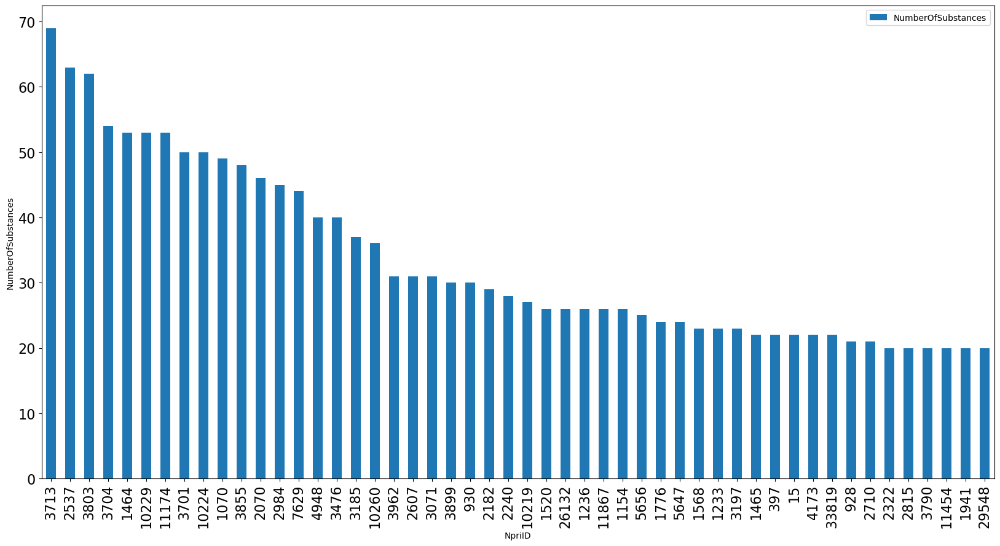

In [4]:
on.show_bar_chart(attribute="NumberOfSubstances")

Use the `near` argument to find facilities within 10km of a specific location. Provide a list with a latitude and longitude, like `[lat, long]`. Show these facilities using the `show_map` function:

In [5]:
guelph = npri.Facilities(near=[43.54, -80.25])
guelph.show_map()

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/near=43.54,-80.25 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/near=43.54,-80.25


The `show_map` function will map a specific aspect of the data if we use the `attribute` argument, just like `show_bar_chart` visualized a column from the data table in chart form. In this case, the bigger the circles, the more substances the facility reported to NPRI in 2022.

In [6]:
guelph.show_map(attribute="NumberOfSubstances")

# What does this specific facility report releasing?
To retrieve information about any given facility (or set of facilities), we can use their NPRI identifers/ids, which are integers given to each facility to track it over time. For instance, a previous search may have told you a facility is a major polluter in an area. You can find more information about it through this search.

To find a single facility this way, enter its id as a string in a list:

In [7]:
this_fac = npri.Facilities(ids=["3287"])
this_fac.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/ids=3287 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/ids=3287


,ActiveYears,NumberOfActiveYears,ReportYear,NumberOfReports,NumberOfSubstances,NumberOfMedia,NumberOfMeasureMethods,NumberOfVOCs,NumberOfPAHs,Substances,...,DUNSNumber,MailingAddressID,Website,MostRecentYear,Owners,Addresses,NAICSPrimary,NAICSTitleEn,dauid,geometry
NpriID,,,,,,,,,,,,,,,,,,,,,
3287,"1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000...",30,2022,1,4,3,2,0,0,"Chromium (and its compounds), Nitrogen oxides ...",...,,692212,,NaN,"OC Canada Holdings Company, Owens Corning Comp...",,327214,Glass manufacturing,35230166,POINT (7158157.751 903332.766)


The `Substances` column contains a list of all substances reported by this facility in 2022. See this by accessing `this_fac.data` and then using the `at[id,col]` command, where id = the NpriID and col = the `Substances` column:

In [8]:
this_fac.data.at[3287,"Substances"]

'Chromium (and its compounds), Nitrogen oxides (expressed as nitrogen dioxide), PM10 - Particulate Matter <= 10 Micrometers, PM2.5 - Particulate Matter <= 2.5 Micrometers'

To find a *set* of facilities, just add to the list:

In [9]:
these_fac = npri.Facilities(ids=["3287", "1436"])
these_fac.show_map()

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/ids=3287,1436 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/ids=3287,1436


## Filter data using multiple parameters
Based on the above searches, we might want to find facilities near Guelph that report releasing certain substances. We can do that in one single query by using multiple parameters, such as `near` and `substances`.

In [10]:
these_facs = npri.Facilities(near=[43.5, -80.25], substances=["Copper", "nitric"])
these_facs.show_map()

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/facilities/near=43.5,-80.25;substances=Copper,nitric report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/facilities/near=43.5,-80.25;substances=Copper,nitric


## Get information about places

Now that we know a little about NPRI-reporting facilities in a place, we might be interested in the socio-economic characteristics of that place, or summaries (rather than individual records from individual facilities) of releases in that place.

As with facilities, we can search using a geographic coordinate (latitude and longitude), a list of identifiers (Census dissemination area ids), or a province/territory abbreviation (rather than a Forward Sortation Area code).

In the case of a coordinate search, we set the `near` argument equal to a list with the coordinates. By default, we search for all Census dissemination areas that fall within 10km of the place.

Currently, the only Census variable loaded into the database is for "Total Visible Minority" population. The field `C10_RATE_TOTAL` provides the percentage.

In [11]:
glph = npri.Places(near=[43.54, -80.25])
glph.show_map(attribute="C10_RATE_TOTAL", title="% Visible Minority")

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/places/near=43.54,-80.25 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/places/near=43.54,-80.25


To search across a province or territory, set the `across` argument equal to the postal code abbreviation of the province (e.g. AB). The following will map out the number of different, or distinct, VOCs reported in each dissemination area (note: NPRI lumps together many VOC species so the `NumberOfVOCs_Distinct` is likely an undercount). By "distinct", we mean that in any given place, several facilities may report releasing the same kind of VOC, but we would count it only once. To look at the total number of VOCs across all facilities, do `attribute="NumberOfVOCs"`

In [12]:
ab = npri.Places(across=["AB"])
ab.show_map(attribute="NumberOfVOCs_Distinct", title="Number of VOCs")

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/places/across=AB report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/places/across=AB


When mapping, we can combine datasets in order to contextualize them. For instance, we could layer facility locations with socio-economic information.

Here, we set the Guelph dissemination areas (`glph`) as the basemap and then add Guelph facilities (`guelph`) as the `other_data`. `guelph.features[None]` simply shows the locations of facilities in Guelph as points, but if we have previously calculated points for a parameter (above: `NumberOfSustances`) we can use that: `guelph.features['NumberOfSubstances']`.

In [13]:
glph.show_map(attribute="C10_RATE_TOTAL", other_data=guelph.features['NumberOfSubstances'], title="% Visible Minority")

There are a number of columns in Places data that summarize air pollutant releases and that may be interesting to map. Keep in mind that these maps do not reflect pollution *concentrations* in an area, simply the total amount of the pollutant reported being released to NPRI from facilities within that area:

In [14]:
to = npri.Places(near=[43.65, -79.6])
to.show_map(attribute="releases_to_air_2022")

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/places/near=43.65,-79.6 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/places/near=43.65,-79.6


## Get information about companies

We summarized pollution releases by company owner, and those records are available through the Companies data. NPRI's records on corproate ownership are not perfect, so keep in mind that there are likely gaps and errors. Search for a specific company like so:

In [15]:
companies = npri.Companies(companies=["Shell"])
companies.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/company/companies=Shell report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/company/companies=Shell


,total_co_2022,total_so2_2022,total_ammonia_2022,total_pm10_2022,total_pm25_2022,total_no2_2022,total_voc_2022,releases_to_air_2022,CompanyName,Owners,...,NumberOfReports,NumberOfSubstances,NumberOfSubstances_Percentile,NumberOfMedia,NumberOfMeasureMethods,NumberOfVOCs_Distinct,NumberOfVOCs,NumberOfPAHs,Substances,CAS
CompanyId,,,,,,,,,,,,,,,,,,,,,
180021,1174.55700,11364.09200,NaN,3.389000,3.321000,1884.96900,272.661000,14747.486000,Shell Canada Energy Limited,None,...,1,29,0.985724,5,3,4,8,8,"2-Butoxyethanol, Ammonia (total), Arsenic (and...","111-76-2, 11104-93-1, 115-07-1, 129-00-0, 1313..."
180022,803.35132,NaN,16.774982,13.825550,13.825550,296.64934,209.597410,1567.390129,Shell Canada Limited-1,None,...,1,15,0.938719,2,3,9,25,0,"Ammonia (total), Benzene, Carbon monoxide, Cyc...","107-21-1, 108-88-3, 110-54-3, 110-82-7, 11104-..."
180023,160.39792,357.16100,NaN,0.552660,0.552660,25.18314,8.061170,555.033960,Shell Canada Limited-1,None,...,1,8,0.592096,1,4,1,2,0,"Carbon monoxide, Nitrogen oxides (expressed as...","11104-93-1, 630-08-0, 7446-09-5, N/A (Speciate..."
180024,NaN,NaN,NaN,2.208969,2.208969,NaN,NaN,4.577276,Shell Canada Limited-1,None,...,1,7,0.557277,2,3,5,11,0,"Cyclohexane, Ethylene glycol, n-Hexane, PM10 -...","107-21-1, 108-88-3, 110-54-3, 110-82-7, 1330-2..."
180025,45.82482,1.29501,NaN,0.251710,0.251710,53.75790,23.628980,130.984870,Shell Canada Limited-1,None,...,1,8,0.592096,1,4,1,3,0,"Carbon monoxide, Nitrogen oxides (expressed as...","11104-93-1, 630-08-0, 7446-09-5, N/A (Speciate..."
180026,NaN,NaN,NaN,NaN,NaN,NaN,50.473000,53.658000,Shell Canada Products,Shell Canada Limited,...,1,8,0.592096,4,3,7,20,0,"1,2,4-Trimethylbenzene, Biphenyl, Cumene, Ethy...","100-41-4, 108-88-3, 1330-20-7, 92-52-4, 95-63-..."
180027,NaN,NaN,NaN,NaN,NaN,NaN,55.853550,68.043656,Shell Canada Products,Shell Canada Limited,...,1,10,0.896936,4,2,9,26,0,"1,2,4-Trimethylbenzene, Benzene, Biphenyl, Cyc...","100-41-4, 108-88-3, 110-54-3, 110-82-7, 1330-2..."
180028,NaN,NaN,NaN,NaN,NaN,NaN,277.218950,368.735300,Shell Canada Products,Shell Canada Limited,...,1,7,0.557277,5,2,6,32,0,"1,2,4-Trimethylbenzene, Biphenyl, Ethylbenzene...","100-41-4, 108-88-3, 1330-20-7, 92-52-4, 95-63-..."
180030,512.29110,3029.54500,0.005208,144.799400,78.830600,596.08220,330.322100,5351.068828,Shell Canada Products,Shell Canada Limited,...,1,31,0.987117,6,6,15,58,1,"1,2,4-Trimethylbenzene, 1,3-Butadiene, Ammonia...","100-41-4, 106-99-0, 108-88-3, 110-54-3, 110-82..."


What's returned are records representing companies NPRI considerates separate, each of which accounts for at least one NPRI facility. In this case, the search returns records where the `'CompanyName'` column contains the string "Shell". The following shows how many NPRI ids/facilities these companies are responsible for:

In [16]:
companies.data["CountOfNPRIidsThisCompany"].sum()

24

To search across multiple companies, add to the list:

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/company/companies=Shell,Suncor report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/company/companies=Shell,Suncor


<AxesSubplot:xlabel='CompanyId', ylabel='releases_to_air_2022'>

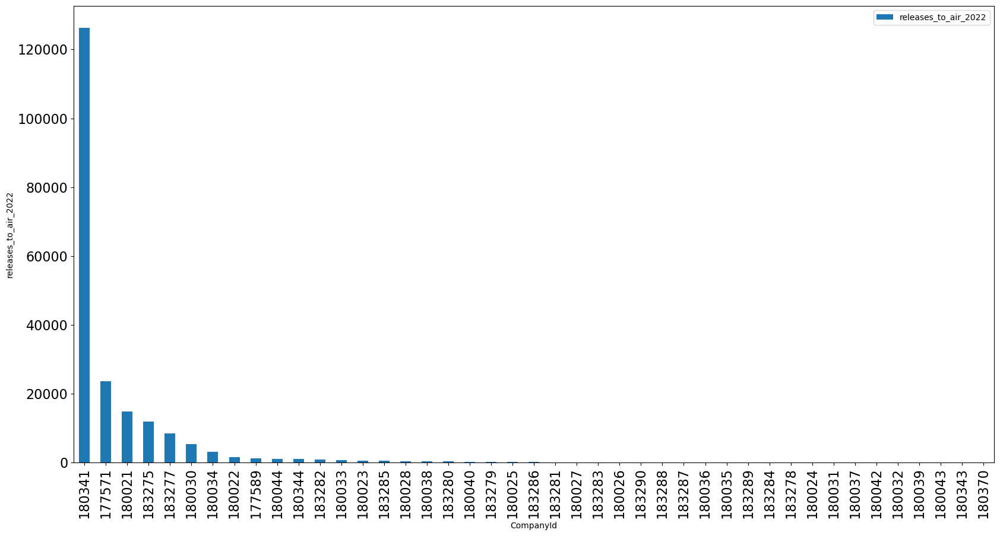

In [17]:
companies = npri.Companies(companies=["Shell", "Suncor"])
companies.show_bar_chart(attribute="releases_to_air_2022")

## Get information about entire industrial sectors

You may be interested not just in specific companies, but entire sectors such as oil/gas extraction. Use `npri.Industries(industries=["industry name"])` where industry name is the English-language name of a sector defined by the NAICS six digit code system. See more [here](https://www23.statcan.gc.ca/imdb/p3VD.pl?Function=getVD&TVD=1181553). So, the following will return summaries of pollution releases for each industrial sector that has a name containing either the term "oil" or the term "gas".

In [18]:
og = npri.Industries(industries=["oil", "gas"])
og.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/industry/industries=oil,gas report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/industry/industries=oil,gas


,total_co_2022,total_so2_2022,total_ammonia_2022,total_pm10_2022,total_pm25_2022,total_no2_2022,total_voc_2022,releases_to_air_2022,NAICSTitleEn,NumberOfReports,NumberOfSubstances,NumberOfSubstances_Percentile,NumberOfMedia,NumberOfMeasureMethods,NumberOfVOCs_Distinct,NumberOfVOCs,NumberOfPAHs,Substances,CAS
NAICSPrimary,,,,,,,,,,,,,,,,,,,
111120,NaN,NaN,NaN,NaN,NaN,NaN,23.161000,46.322000,Oilseed (except soybean) farming,1,2,0.086093,1,1,1,1,0,"Speciated VOCs (62 substances), Volatile Organ...","N/A (Speciated VOCs), NA - M16"
211110,150250.926011,85742.781896,441.335866,4363.561987,4173.561102,185350.053722,56312.909917,530747.686146,Oil and gas extraction (except oil sands),3258,51,0.910596,8,8,27,7530,6,"1,2,4-Trimethylbenzene, 2-Butoxyethanol, 2-Pro...","100-41-4, 107-21-1, 108-88-3, 110-54-3, 110-82..."
211141,24316.132384,18591.085229,726.509754,2094.982618,821.053110,24882.157994,3034.082339,83726.681638,In-situ oil sands extraction,32,54,0.930464,7,8,22,826,19,"1,2,4-Trimethylbenzene, Acenaphthene, Acenapht...","100-41-4, 107-21-1, 108-88-3, 110-54-3, 110-82..."
211142,17320.253316,55348.536024,1351.163044,35495.274769,7939.299230,32101.005221,53264.689622,362382.561312,Mined oil sands extraction,8,80,0.983444,8,8,29,603,23,"1,2,4-Trichlorobenzene, 1,2,4-Trimethylbenzene...","100-41-4, 100-42-5, 106-46-7, 107-21-1, 108-88..."
213118,NaN,NaN,NaN,5.791500,4.069500,29.210000,1329.174000,1973.686000,Services to oil and gas extraction,13,24,0.801325,5,4,17,60,1,"1,2,4-Trimethylbenzene, 2-Butoxyethanol, Benze...","100-41-4, 107-21-1, 108-88-3, 110-54-3, 110-82..."
221210,273.320200,NaN,NaN,0.538800,1.012800,490.947100,16.829100,782.648000,Natural gas distribution,3,5,0.294702,1,3,1,3,0,"Carbon monoxide, Nitrogen oxides (expressed as...","11104-93-1, 630-08-0, NA - M09, NA - M10, NA -..."
311224,325.000200,117.256600,NaN,376.586447,174.246548,395.815200,4164.703636,12643.222501,Oilseed processing,13,17,0.728477,4,5,5,54,0,"Carbon monoxide, Cyclohexane, Formaldehyde, Hy...","110-54-3, 110-82-7, 11104-93-1, 50-00-0, 630-0..."
311225,34.900000,NaN,NaN,97.500000,39.900000,40.300000,247.900000,865.700000,Fat and oil refining and blending,2,12,0.615894,2,4,2,2,0,"Carbon monoxide, Hydrogen sulphide, n-Hexane, ...","110-54-3, 11104-93-1, 630-08-0, 7664-93-9, 778..."
325120,670.340000,NaN,7.525000,80.098000,78.081000,599.698000,97.411000,1624.987000,Industrial gas manufacturing,12,14,0.668874,4,5,4,14,0,"Ammonia (total), Carbon monoxide, Copper (and ...","107-21-1, 11104-93-1, 115-07-1, 630-08-0, 67-5..."


## Get information about specific substances
Sometimes, we're just information in nationwide summaries for a specific pollutant or set of pollutants. Substances data provides that. Set the `pollutants` argument equal to the name of a pollutant:

In [19]:
mercury = npri.Substances(pollutants=["mercury"])
mercury.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/substance/pollutants=mercury report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/substance/pollutants=mercury


,SubstanceID,NumberOfReports,NumberOfReports2022,NumberOfReportsPast5Years,NumberOfNPRIids,NumberOfDAs
Substance,,,,,,
Mercury (and its compounds),14203,6423,250,1294,767,587


Add to the list to compile information across multiple substances:

In [20]:
some_heavy_metals = npri.Substances(pollutants=["lead", "mercury", "cadmium"])
some_heavy_metals.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/substance/pollutants=lead,mercury,cadmium report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/substance/pollutants=lead,mercury,cadmium


,SubstanceID,NumberOfReports,NumberOfReports2022,NumberOfReportsPast5Years,NumberOfNPRIids,NumberOfDAs
Substance,,,,,,
Mercury (and its compounds),14203,6423,250,1294,767,587
Lead (and its compounds),14200,15410,580,3063,1598,1115
Cadmium (and its compounds),14192,8077,389,1932,869,667
Tetraethyl lead,14075,118,3,15,15,14


## Get historical information

Most records returned from the database are for the most current reporting year, though, for some datasets, summaries for the past 5 years (e.g. 'NumberOfReportsPast5Years') as well as since record-keeping began in 1993 ('NumberOfReports') are available .

`Times` allows retrieving information for specific substances, companies, and dissemination areas (though with this latter one, Census data is still only for 2021). Provide the start and stop years in a list like `[start, stop]`. This is an inclusive range so it means start *through* start.

For instance, here's substances summaries for 2008-2015:

In [21]:
subs = npri.Times(view="time_substance", years=[2008,2015])
subs.data

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/time_substance/years=2008,2015 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/time_substance/years=2008,2015


,ReportYear,NumberOfReports,Quantity,Units
Substance,,,,
1-Nitropyrene,2008,4,5.709000,kg
"1,1-Methylenebis(4-isocyanatocyclohexane)",2008,2,0.002000,tonnes
"1,1,1,2-Tetrachloroethane",2008,1,0.001000,tonnes
"1,1,2-Trichloroethane",2008,2,0.125000,tonnes
"1,1,2,2-Tetrachloroethane",2008,1,0.001000,tonnes
...,...,...,...,...
Vinyl acetate,2015,10,356.966000,tonnes
Vinyl chloride,2015,3,0.387100,tonnes
Volatile Organic Compounds (VOCs),2015,1772,204720.854508,tonnes


Before displaying this information in a chart, we need to aggregate it. Each row is the sum of a substance reported released using a specific measurement unit in a specific year. That means each substance is likely to appear multiple times here, once for each year (or perhaps more depending on whether it was reported in different units). Because pollutants vary so much in terms of their weight and hence quantity, we might look aggregate pollutants across the years in terms of total number of reports:

<AxesSubplot:xlabel='Substance', ylabel='NumberOfReports'>

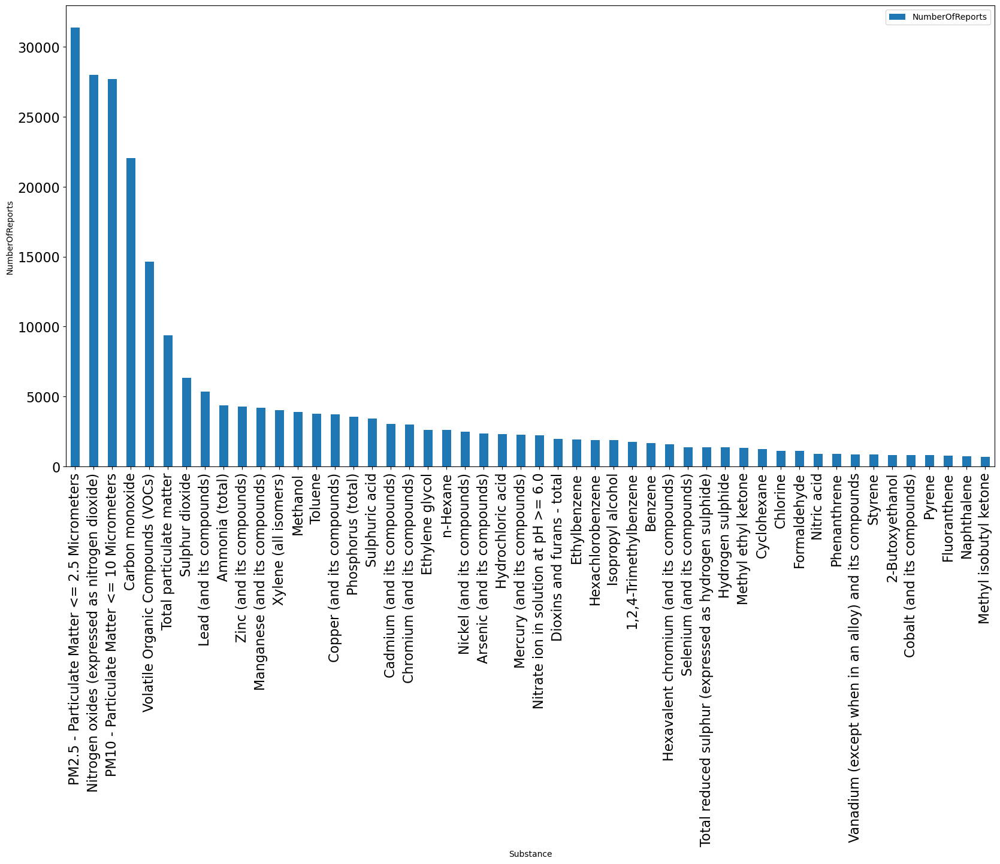

In [22]:
subs.aggregate(attribute="NumberOfReports")
subs.show_bar_chart(attribute="NumberOfReports")

The above shows that PM2.5 was the most reported pollutant during this timeframe.

We can make a similar search and set of operations for companies:

final url:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/data/time_company/years=2008,2015 report:  https://hello-world-1-ixcan5eepa-uc.a.run.app/api/report/time_company/years=2008,2015


<AxesSubplot:xlabel='CompanyID', ylabel='NumberOfReports'>

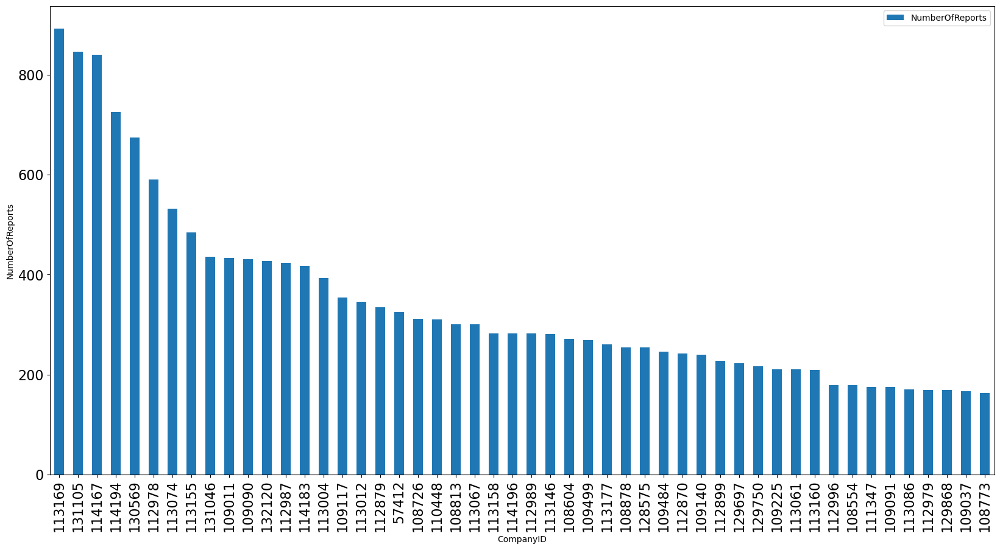

In [23]:
test = npri.Times(view = "time_company", years = [2008, 2015])
test.aggregate(attribute="NumberOfReports")
test.show_bar_chart(attribute="NumberOfReports")